### The HR Dataset was designed by Drs. Rich Huebner and Carla Patalano to accompany a case study designed for graduate HR students studying HR metrics, measurement, and analytics. The students use Tableau data visualization software to uncover insights about the case. This is a synthetic data set created specifically to go along with a case study that is proprietary for the college at which they teach. 


## Goal:  Use the following dataset to create a model to explore factors that increase employment time

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score


In [2]:
hr = pd.read_csv('HRDataset_v14.csv')

In [3]:
hr.head()

,Employee_Name,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,...,ManagerName,ManagerID,RecruitmentSource,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,LastPerformanceReview_Date,DaysLateLast30,Absences
0,"Adinolfi, Wilson K",10026,0,0,1,1,5,4,0,62506,...,Michael Albert,22.0,LinkedIn,Exceeds,4.60,5,0,1/17/2019,0,1
1,"Ait Sidi, Karthikeyan",10084,1,1,1,5,3,3,0,104437,...,Simon Roup,4.0,Indeed,Fully Meets,4.96,3,6,2/24/2016,0,17
2,"Akinkuolie, Sarah",10196,1,1,0,5,5,3,0,64955,...,Kissy Sullivan,20.0,LinkedIn,Fully Meets,3.02,3,0,5/15/2012,0,3
3,"Alagbe,Trina",10088,1,1,0,1,5,3,0,64991,...,Elijiah Gray,16.0,Indeed,Fully Meets,4.84,5,0,1/3/2019,0,15
4,"Anderson, Carol",10069,0,2,0,5,5,3,0,50825,...,Webster Butler,39.0,Google Search,Fully Meets,5.00,4,0,2/1/2016,0,2


In [4]:
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311 entries, 0 to 310
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee_Name               311 non-null    object 
 1   EmpID                       311 non-null    int64  
 2   MarriedID                   311 non-null    int64  
 3   MaritalStatusID             311 non-null    int64  
 4   GenderID                    311 non-null    int64  
 5   EmpStatusID                 311 non-null    int64  
 6   DeptID                      311 non-null    int64  
 7   PerfScoreID                 311 non-null    int64  
 8   FromDiversityJobFairID      311 non-null    int64  
 9   Salary                      311 non-null    int64  
 10  Termd                       311 non-null    int64  
 11  PositionID                  311 non-null    int64  
 12  Position                    311 non-null    object 
 13  State                       311 non

In [5]:
hr.describe().T

,count,mean,std,min,25%,50%,75%,max
EmpID,311.0,10156.000000,89.922189,10001.00,10078.50,10156.00,10233.5,10311.0
MarriedID,311.0,0.398714,0.490423,0.00,0.00,0.00,1.0,1.0
MaritalStatusID,311.0,0.810289,0.943239,0.00,0.00,1.00,1.0,4.0
GenderID,311.0,0.434084,0.496435,0.00,0.00,0.00,1.0,1.0
EmpStatusID,311.0,2.392283,1.794383,1.00,1.00,1.00,5.0,5.0
DeptID,311.0,4.610932,1.083487,1.00,5.00,5.00,5.0,6.0
PerfScoreID,311.0,2.977492,0.587072,1.00,3.00,3.00,3.0,4.0
FromDiversityJobFairID,311.0,0.093248,0.291248,0.00,0.00,0.00,0.0,1.0
Salary,311.0,69020.684887,25156.636930,45046.00,55501.50,62810.00,72036.0,250000.0
Termd,311.0,0.334405,0.472542,0.00,0.00,0.00,1.0,1.0


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
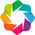

Imported v0.1.720. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [6]:
from autoviz.AutoViz_Class import AutoViz_Class

Shape of your Data Set loaded: (311, 36)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    35 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Employee_Name', 'EmpID']

################ Regression problem #####################
Number of variables = 33 exceeds limit, finding top 30 variables through XGBoost
    No categorical feature reduction done. All 31 Categorical vars selected 
    Removing correlated variables from 2 numerics using SULO method
Selecting all (2) variables since none of them are highly correlated...
    Adding 31 categorical variables to reduced numeric variables  of 2
############## F E A T U R E   S E L E C T I O N  ########

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
ManagerID,float64,2.572347,NA,1.000000,39.000000,"8 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 13 outliers greater than upper bound (32.50) or lower than lower bound(-3.50). Cap them or remove them."
EngagementSurvey,float64,0.000000,NA,1.120000,5.000000,has 9 outliers greater than upper bound (6.22) or lower than lower bound(2.17). Cap them or remove them.
MarriedID,int64,0.000000,0,0.000000,1.000000,No issue
MaritalStatusID,int64,0.000000,1,0.000000,4.000000,has 20 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
GenderID,int64,0.000000,0,0.000000,1.000000,No issue
EmpStatusID,int64,0.000000,1,1.000000,5.000000,No issue
DeptID,int64,0.000000,1,1.000000,6.000000,has 103 outliers greater than upper bound (5.00) or lower than lower bound(5.00). Cap them or remove them.
PerfScoreID,int64,0.000000,1,1.000000,4.000000,has 68 outliers greater than upper bound (3.00) or lower than lower bound(3.00). Cap them or remove them.
FromDiversityJobFairID,int64,0.000000,0,0.000000,1.000000,has 29 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
Termd,int64,0.000000,0,0.000000,1.000000,has a high correlation with ['EmpStatusID']. Consider dropping one of them.


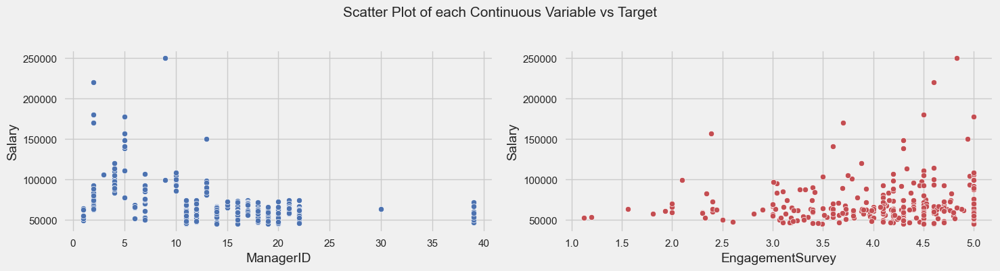

Number of All Scatter Plots = 3


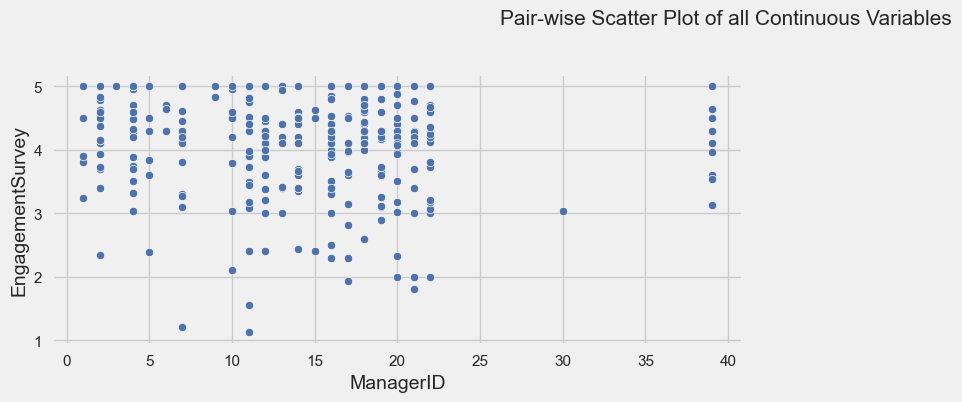

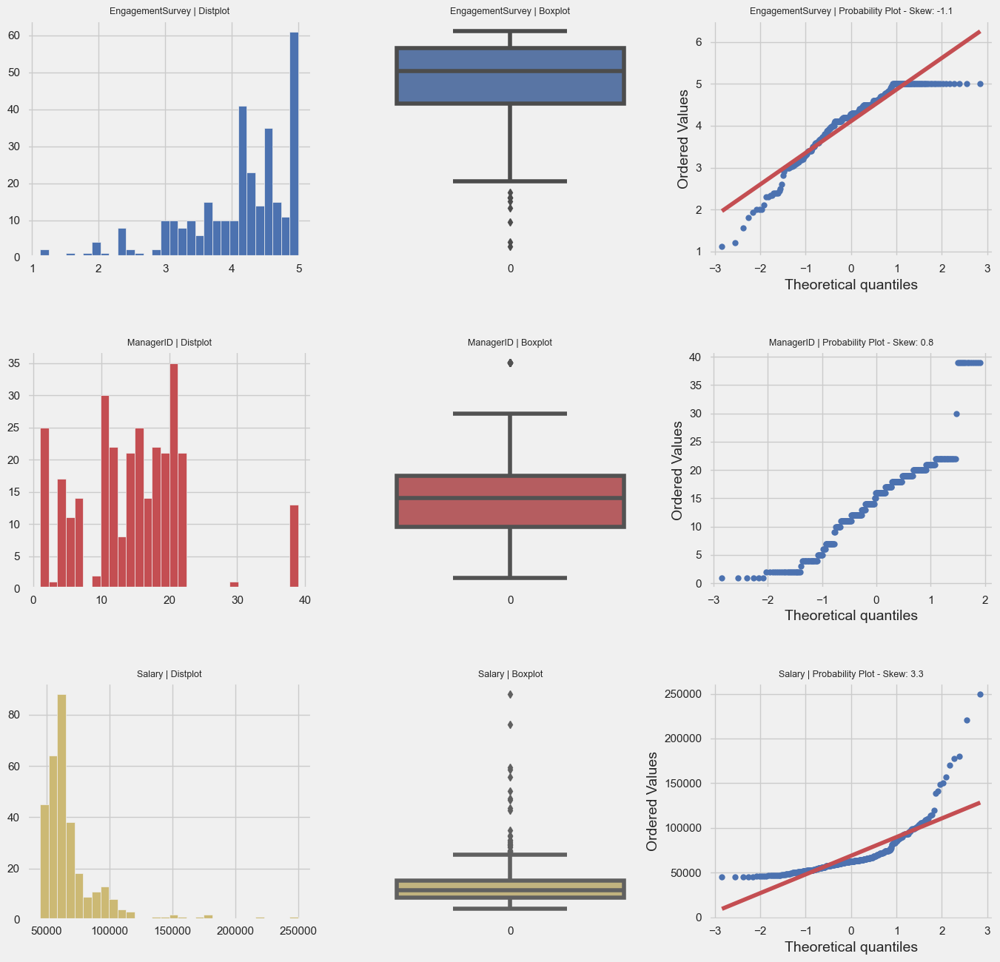

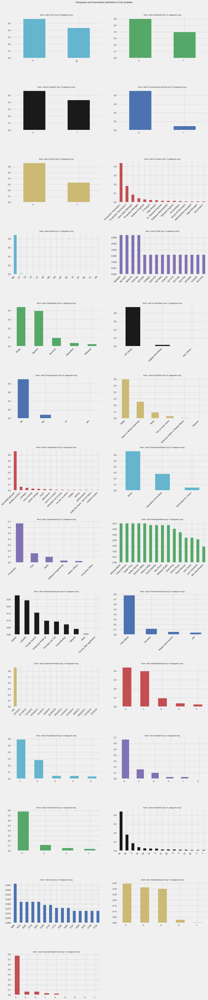

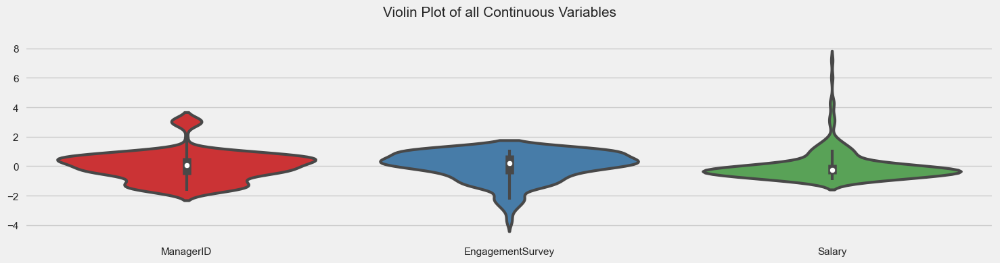

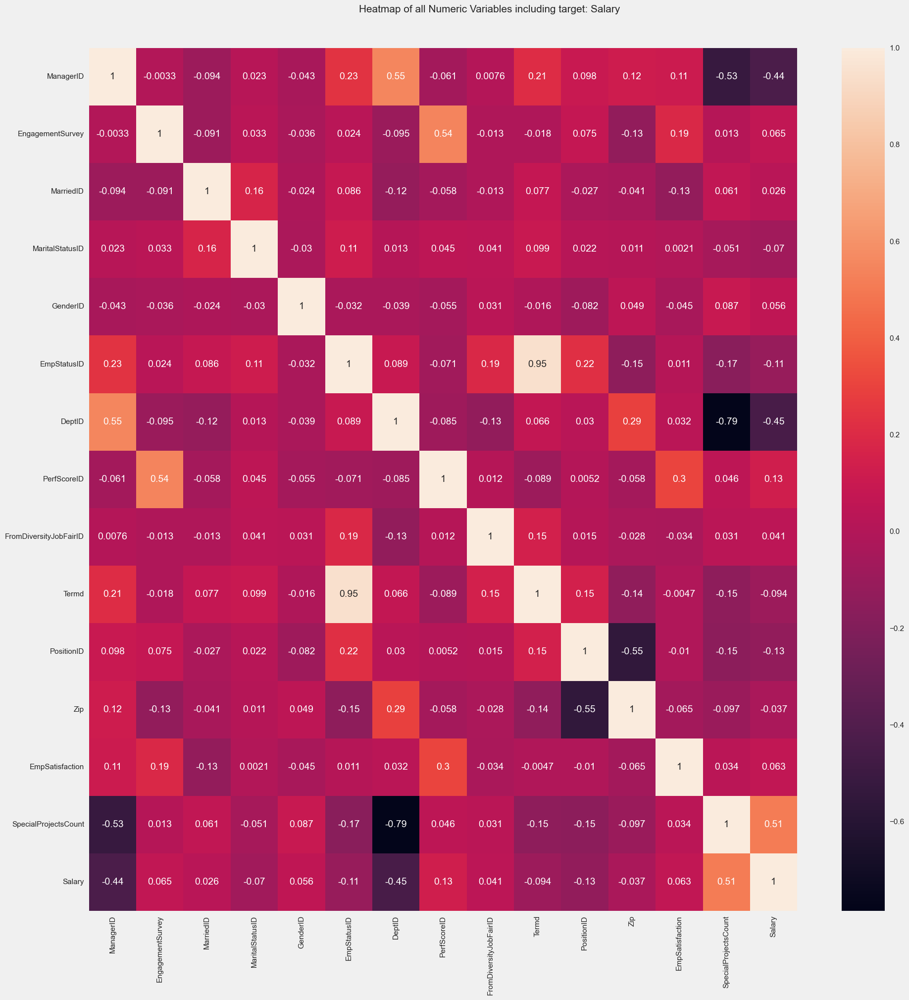

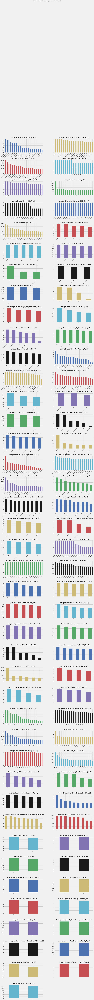

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/susanwhite/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /Users/susanwhite/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /Users/susanwhite/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /Users/susanwhite/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /Users/susanwhite/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /Users/susanwhite/nltk_data...
[nltk_data]    |   Package 

Could not draw wordcloud plot for DateofHire
All Plots done
Time to run AutoViz = 43 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,ManagerID,EngagementSurvey,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Termd,PositionID,Position,State,Zip,DOB,Sex,MaritalDesc,CitizenDesc,HispanicLatino,RaceDesc,DateofTermination,TermReason,EmploymentStatus,Department,ManagerName,RecruitmentSource,PerformanceScore,EmpSatisfaction,SpecialProjectsCount,Salary
0,22.0,4.60,0,0,1,1,5,4,0,0,19,Production Technician I,MA,1960,07/10/83,M,Single,US Citizen,No,White,NaN,N/A-StillEmployed,Active,Production,Michael Albert,LinkedIn,Exceeds,5,0,62506
1,4.0,4.96,1,1,1,5,3,3,0,1,27,Sr. DBA,MA,2148,05/05/75,M,Married,US Citizen,No,White,6/16/2016,career change,Voluntarily Terminated,IT/IS,Simon Roup,Indeed,Fully Meets,3,6,104437
2,20.0,3.02,1,1,0,5,5,3,0,1,20,Production Technician II,MA,1810,09/19/88,F,Married,US Citizen,No,White,9/24/2012,hours,Voluntarily Terminated,Production,Kissy Sullivan,LinkedIn,Fully Meets,3,0,64955
3,16.0,4.84,1,1,0,1,5,3,0,0,19,Production Technician I,MA,1886,09/27/88,F,Married,US Citizen,No,White,NaN,N/A-StillEmployed,Active,Production,Elijiah Gray,Indeed,Fully Meets,5,0,64991
4,39.0,5.00,0,2,0,5,5,3,0,1,19,Production Technician I,MA,2169,09/08/89,F,Divorced,US Citizen,No,White,9/6/2016,return to school,Voluntarily Terminated,Production,Webster Butler,Google Search,Fully Meets,4,0,50825
5,11.0,5.00,0,0,0,1,5,4,0,0,19,Production Technician I,MA,1844,05/22/77,F,Single,US Citizen,No,White,NaN,N/A-StillEmployed,Active,Production,Amy Dunn,LinkedIn,Exceeds,5,0,57568
6,10.0,3.04,0,0,0,1,4,3,0,0,24,Software Engineer,MA,2110,05/24/79,F,Single,US Citizen,No,White,NaN,N/A-StillEmployed,Active,Software Engineering,Alex Sweetwater,LinkedIn,Fully Meets,3,4,95660
7,19.0,5.00,0,4,1,1,5,3,0,0,19,Production Technician I,MA,2199,02/18/83,M,Widowed,US Citizen,No,White,NaN,N/A-StillEmployed,Active,Production,Ketsia Liebig,Employee Referral,Fully Meets,4,0,59365
8,12.0,4.46,0,0,0,3,5,3,1,0,19,Production Technician I,MA,1902,02/11/70,F,Single,US Citizen,No,Black or African American,NaN,N/A-StillEmployed,Active,Production,Brannon Miller,Diversity Job Fair,Fully Meets,3,0,47837
9,7.0,5.00,0,2,1,1,3,3,0,0,14,IT Support,MA,1886,01/07/88,M,Divorced,US Citizen,No,White,NaN,N/A-StillEmployed,Active,IT/IS,Peter Monroe,Indeed,Fully Meets,5,6,50178


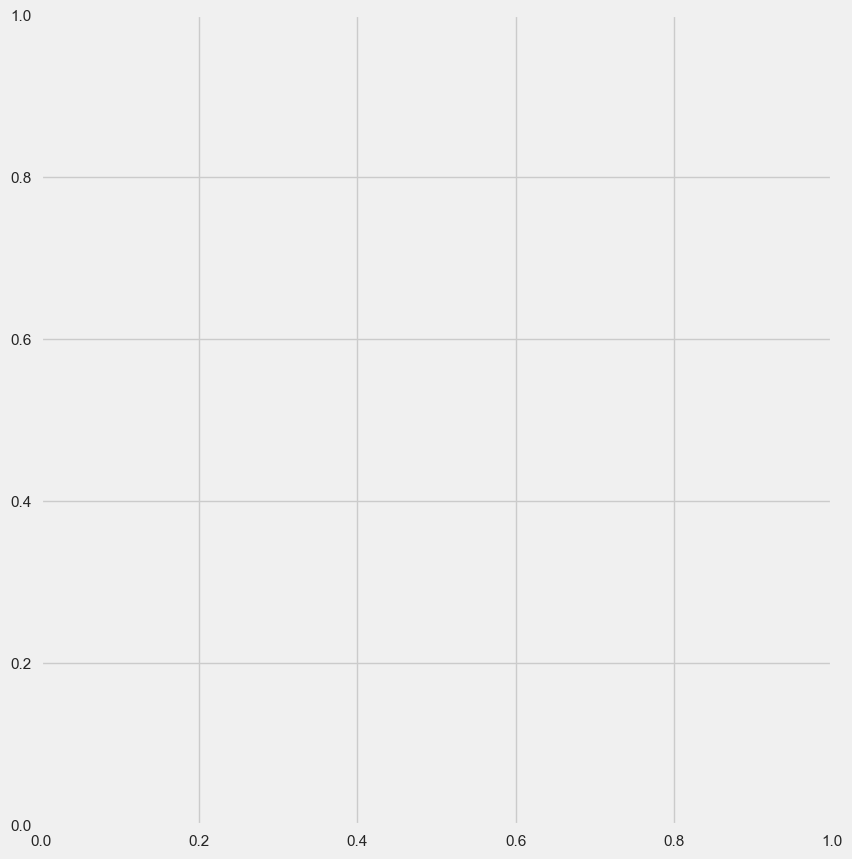

In [7]:
AV = AutoViz_Class()

%matplotlib inline

AV.AutoViz('HRDataset_v14.csv', depVar = 'Salary')

Observations from the EDA: Categorical variables already have a counterpart where they have been encoded.  For example: GenderID is a numerical representation of the Gender column.  These categoricals can be dropped

Dates need to be converted to date-time in pandas.


In [8]:
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311 entries, 0 to 310
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee_Name               311 non-null    object 
 1   EmpID                       311 non-null    int64  
 2   MarriedID                   311 non-null    int64  
 3   MaritalStatusID             311 non-null    int64  
 4   GenderID                    311 non-null    int64  
 5   EmpStatusID                 311 non-null    int64  
 6   DeptID                      311 non-null    int64  
 7   PerfScoreID                 311 non-null    int64  
 8   FromDiversityJobFairID      311 non-null    int64  
 9   Salary                      311 non-null    int64  
 10  Termd                       311 non-null    int64  
 11  PositionID                  311 non-null    int64  
 12  Position                    311 non-null    object 
 13  State                       311 non

In [9]:
hr = hr.drop(['Sex','MaritalDesc','CitizenDesc', 'RaceDesc','ManagerName', 'RecruitmentSource','PerformanceScore','Position','State', 'Zip', 'TermReason', 'EmploymentStatus','Department','HispanicLatino'], axis=1)
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311 entries, 0 to 310
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee_Name               311 non-null    object 
 1   EmpID                       311 non-null    int64  
 2   MarriedID                   311 non-null    int64  
 3   MaritalStatusID             311 non-null    int64  
 4   GenderID                    311 non-null    int64  
 5   EmpStatusID                 311 non-null    int64  
 6   DeptID                      311 non-null    int64  
 7   PerfScoreID                 311 non-null    int64  
 8   FromDiversityJobFairID      311 non-null    int64  
 9   Salary                      311 non-null    int64  
 10  Termd                       311 non-null    int64  
 11  PositionID                  311 non-null    int64  
 12  DOB                         311 non-null    object 
 13  DateofHire                  311 non

In [10]:
hr[['DOB','DateofHire','DateofTermination', 'LastPerformanceReview_Date']]=hr[['DOB','DateofHire','DateofTermination', 'LastPerformanceReview_Date']].apply(pd.to_datetime)

In [11]:
hr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311 entries, 0 to 310
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Employee_Name               311 non-null    object        
 1   EmpID                       311 non-null    int64         
 2   MarriedID                   311 non-null    int64         
 3   MaritalStatusID             311 non-null    int64         
 4   GenderID                    311 non-null    int64         
 5   EmpStatusID                 311 non-null    int64         
 6   DeptID                      311 non-null    int64         
 7   PerfScoreID                 311 non-null    int64         
 8   FromDiversityJobFairID      311 non-null    int64         
 9   Salary                      311 non-null    int64         
 10  Termd                       311 non-null    int64         
 11  PositionID                  311 non-null    int64         

In [12]:
hr['length'] = ''
for i in range(len(hr['Termd'])):
    if hr['Termd'].loc[i] == 1:
        hr['length'].loc[i] = hr['DateofTermination'].loc[i] - hr['DateofHire'].loc[i]  
    else:
        hr['length'].loc[i] = pd.Timestamp.today() - hr['DateofHire'].loc[i] 

In [13]:
from pycaret.regression import *

In [14]:
X = hr.drop(['length', 'Employee_Name', 'DateofHire', 'DateofTermination', 'Termd'], axis = 1)
y = hr['length']

In [15]:
s = setup(data = X, target = y, session_id = 42)

,Description,Value
0,Session id,42
1,Target,length
2,Target type,Regression
3,Original data shape,"(311, 19)"
4,Transformed data shape,"(311, 23)"
5,Transformed train set shape,"(217, 23)"
6,Transformed test set shape,"(94, 23)"
7,Numeric features,16
8,Date features,2
9,Rows with missing values,2.6%


In [16]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
knn,K Neighbors Regressor,0.0000,0.0000,0.0000,0.0000,0.0000,1.7743,0.5190


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

In [18]:
model = create_model('lr')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
1,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
2,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
3,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
4,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
5,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
6,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
7,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000
8,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0000


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [19]:
evaluate_model(model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…